# Project: **Advanced Lane Lines** 
***

The purpose of this project is to find curved lane lines where more challenging road situations exist, such as presence of shadows and plenty of brightness as well as other obstacles (e.g. bridges). The pipeline developed is tried on the road from still images and a video stream.

--------
The three additional efforts are made to improve a lane line detection efficient and more robust in this project.

1. Once lanes are found with certain level of confidence in the first frame, lane lines on the next frames can be searched within the margin from the previously-found lane line pixels.

2. To adapt changes from curved lanes, the trapezoidal shapes of the four source points are found through a lane detection method with mask, Hough transformation and interpolation, rather than a manual identification.

3. To avoid jitter, the previously-found lane lines are averaged, weighted and combined together with the current lane lines found. This practice improved the performance on the curved lane lines.


## Set up packages to use

Prior to this problem solving, I will import all required packages for a lane detection of curved lanes for both still images and video streams.

In [1]:
#import libraries to be used and set up for a plot inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
#the following package is for unpacking and packing video streams
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

Imageio: 'ffmpeg.linux64' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg.linux64 (27.2 MB)
Downloading: 8192/28549024 bytes (0.01753088/28549024 bytes (6.1%3956736/28549024 bytes (13.96512640/28549024 bytes (22.88978432/28549024 bytes (31.411386880/28549024 bytes (39.9%13565952/28549024 bytes (47.5%16261120/28549024 bytes (57.0%19095552/28549024 bytes (66.9%21561344/28549024 bytes (75.5%24092672/28549024 bytes (84.4%26673152/28549024 bytes (93.4%28549024/28549024 bytes (100.0%)
  Done
File saved as /root/.imageio/ffmpeg/ffmpeg.linux64.


## Helper functions step by step

There are 8 steps gone through to identify lane lines:

1. Create object and image points and undistort the image from this information.
2. Extract features from gradient thresholding.
3. Extract features from colour thresholding.
4. Combine the aforementioned two thresholding together.
5. Transform a persepective to make the image appearing look down from the top (i.e. bird eye view).
6. Find lane line pixels with a sliding window approach.
7. Interpolate the lane lines from the pixels.
8. Measure curvature.

### Camera calibration and Undistort images

To undistort an image, finding corner and calibrating camera from a 3D to 2D image and undistorting the image with the camera matrix found from the previous steps. To do so, a chessboard image is useful because it is easy to find corners of the chessboard and map them into an undistorted image.

In [2]:
def create_object_image_points(n_x, n_y):
    #using glob, make a list of calibration images under camera_cal directory (20 images)
    images = glob.glob('./camera_cal/calibration*.jpg')

    #initialise object points (anchor) and image points (distorted positions)
    obj_p = []
    img_p = []
    
    #define number of insdie corners in x and y - project specification is 9 by 6
    nx = n_x
    ny = n_y
    
    #define obj_points based on dimensions of 9 by 6
    #create obj_points with three channels and ny*nx dimensions
    obj_points = np.zeros((ny*nx, 3), np.float32)
    #then first two channels are populated through its coordinate position (x, y) 
    #through meshgrid transformed and reshaped to first two columns
    obj_points[:, :2] = np.mgrid[:nx, :ny].T.reshape(-1, 2)

    for file_name in images:
        #read in one image
        img = cv2.imread(file_name)
        #change colour to gray
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        #find the corners of chessboard 
        #https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.findChessboardCorners
        #to determine whether the input image is a view of the chessboard pattern 
        #and locate the internal chessboard corners. Parameters: image, corner dimension, corners, flags
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        #non zero value for 'ret' if all corners are found.
        if ret:
            #append found corners to img_p
            img_p.append(corners)
            #append anchor to obj_p
            obj_p.append(obj_points)
            #https://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.drawChessboardCorners
            #draws individual chessboard corners detected either as red circles if the board was not found, 
            #or as colored corners connected with lines if the board was found.
            #patternWasFound parameter indicates that whether the complete board was found or not.
            cv2.drawChessboardCorners(img, (nx, ny), corners=corners, patternWasFound=ret)
#             plt.imshow(img)
    return img_p, obj_p

In [3]:
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)

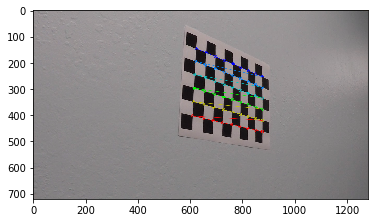

In [5]:
# img_p, obj_p = create_object_image_points(n_x=9, n_y=6)

In [4]:
def undistort_img(img, obj_points, img_points):
    #undistort an image using cv2.calibrateCamera() and cv2.undistort()
    #calibrate camera to generate camera matrix and distortion coefficient r
    img_shape = img.shape
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, (img_shape[1], img_shape[0]), None, None)
    #then using camera matrix and distortion coefficient, undistort the image
    #math formula is https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_calib3d/py_calibration/py_calibration.html
    undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)

    return undistorted_img    

The original chessboard image is undsitorted in the following steps.

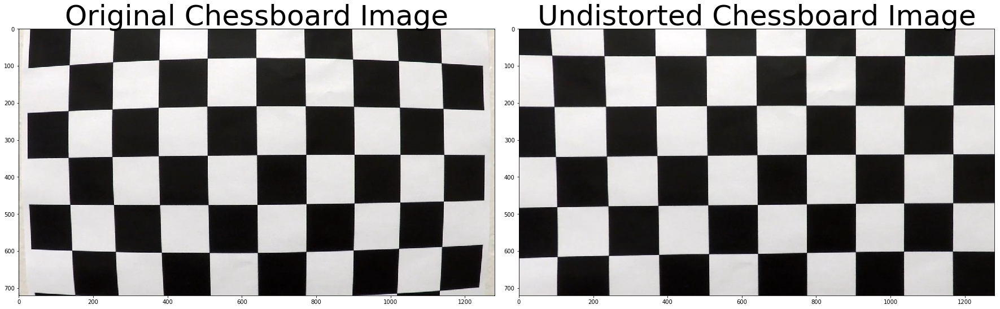

In [103]:
img = cv2.imread('camera_cal/calibration1.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
undistorted_image = undistort_img(img, obj_p, img_p)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Chessboard Image', fontsize=50)
undistorted_image = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB)
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Chessboard Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

This undistortion is applied to the view from a car below. The undistorted image looks almost similar to the original image but there is a slight difference, in particular, where you look at the car's bonnet is located.

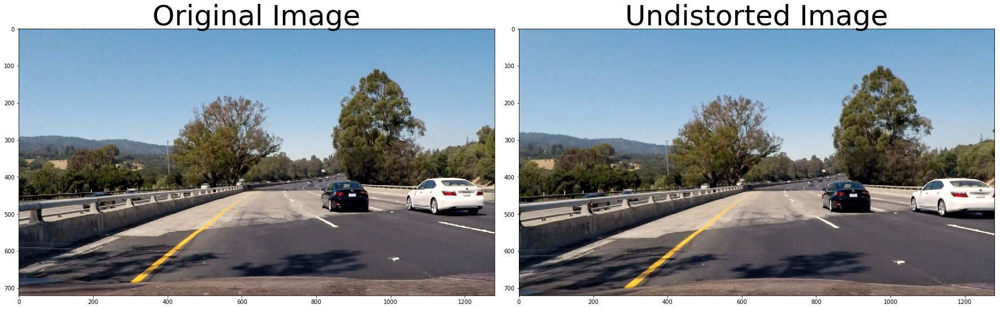

In [7]:
img = cv2.imread('test_images/test4.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
undistorted_image = undistort_img(img, obj_p, img_p)

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
undistorted_image = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB)
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Extract features through gradient thresholding

The four thresholding steps are performed within this gradient thresholding.

* magnitude changes in x gradients
* magnitude changes in y gradients
* magnitude changes in both x and y gradients
* direction of gradients

The 'find_sobel' function below returns the maginitude changes of either x or y gradients.

In [5]:
def find_sobel(img, orient='x', sobel_k=3, thresh_min=0, thresh_max=255):
    '''This function is to identify and threshold x or y gradients.'''
    
    #https://docs.opencv.org/2.4/doc/tutorials/imgproc/imgtrans/sobel_derivatives/sobel_derivatives.html
    #orientation x highlights vertical lines
    if orient=='x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_k)
    #orientation y highlights horizontal lines
    if orient=='y':
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_k)

    #make it absolute value
    abs_sobel = np.absolute(sobel)
    
    #scale abs_sobel based on max value into 8-bit unsigned integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    #create a mask
    binary_output = np.zeros_like(scaled_sobel)
    
    #create binary_output with "AND" operations
    binary_output[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)]=1
    
    return binary_output

It is time to identify a magnitude of gradients by combining x and y orientation together. The 'find_magnitude' function below returns both x ad y's changes in magnitudes. This function picks up the gradient differences well as seen below.

In [6]:
def find_magnitude(img, sobel_k=3, thresh_min=0, thresh_max=255):
    '''This function is to identify and threshold a magnitude of gradients for both x and y direction.'''  
    
    #apply cv2.Sobel() - sobel kernel size can make a difference
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_k)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_k)
    
    #calculate absolute value with squaure root
    abs_sobel = np.sqrt(np.square(sobel_x) + np.square(sobel_y))
    
    #scale abs_sobel based on max value into 8-bit
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    #create a mask
    magnitude_output = np.zeros_like(scaled_sobel)
    
    #create binary_output with "AND" operations
    magnitude_output[(scaled_sobel>=thresh_min) & (scaled_sobel<=thresh_max)]=1
    
    return magnitude_output

When I use a sobel kernel size 19, more coarse gradient differences are returned - the lines are thicker.

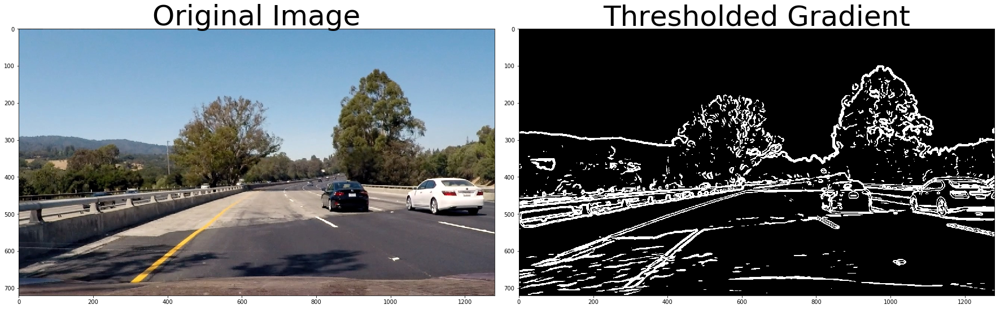

In [12]:
img = cv2.imread('test_images/test4.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)
undistorted_image_gray = cv2.cvtColor(undistorted_image,cv2.COLOR_BGR2GRAY)
sobel_image = find_magnitude(undistorted_image_gray, 19, 40, 150)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_image, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

When a sobel kernel size 3 is used, more refined lines are shown.

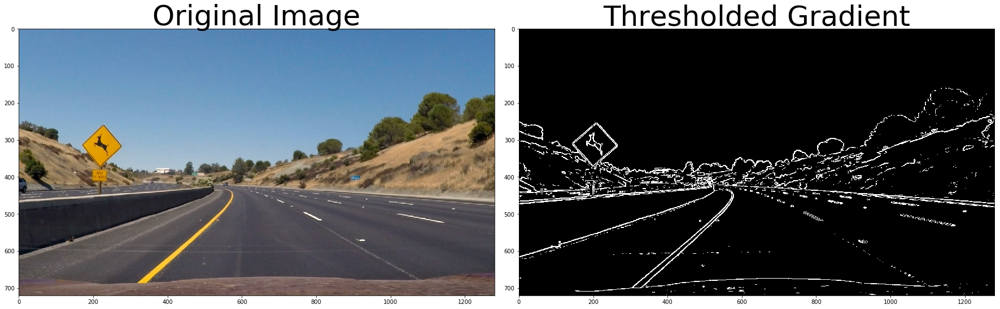

In [13]:
img = cv2.imread('test_images/test2.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)
undistorted_image_gray = cv2.cvtColor(undistorted_image,cv2.COLOR_BGR2GRAY)
sobel_image = find_magnitude(undistorted_image_gray, 3, 40, 150)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(sobel_image, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

A direction of gradients can be calculated through a arctan function. This function alone does not return clear lines. In fact, it is quite noisy, but it helps to identify lines on the ground only.

In [7]:
def find_direction(img, sobel_k=3, thresh_min=0, thresh_max=np.pi/2):
    '''This function is to identify and thresold a direction of gradients.'''
    #calculate sobel_x and sobel_y to find the magnitude of gradients
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_k)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_k)
    #calculate aabsolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    #calculate the direction of the gradient using np.arctan2
    direction = np.arctan2(abs_sobel_y, abs_sobel_x)
    #create a mask
    binary_output = np.zeros_like(direction)
    #create binary_output with "AND" operation for the values between direction
    binary_output[(direction>=thresh_min) & (direction<=thresh_max)] = 1
    
    return binary_output

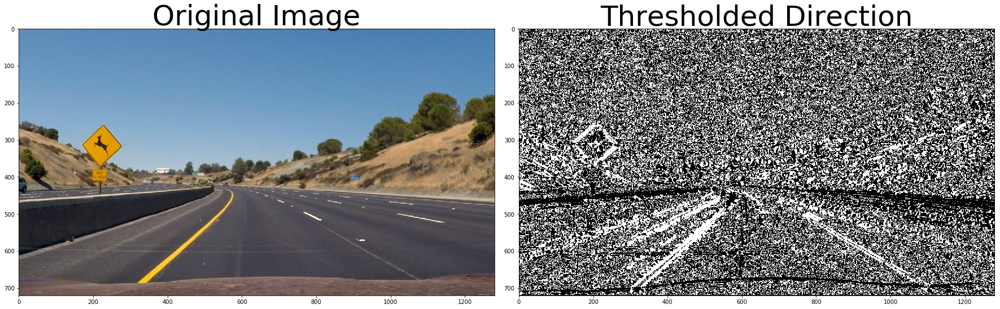

In [15]:
img = cv2.imread('test_images/test2.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)
undistorted_image_gray = cv2.cvtColor(undistorted_image,cv2.COLOR_BGR2GRAY)
dir_image = find_direction(undistorted_image_gray, 13, thresh_min=0.7, thresh_max=1.3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_image, cmap='gray')
ax2.set_title('Thresholded Direction', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

All these efforts to differentiate gradients are combined through the following 'combine_threshold_gradients' function.

In [8]:
def combine_threshold_gradients(x_gradients, y_gradients, magnitude, direction):
    combined_gradients = np.zeros_like(direction)
    combined_gradients[((x_gradients==1) & (y_gradients==1)) | ((magnitude==1) & (direction==1))] = 1
    
    return combined_gradients

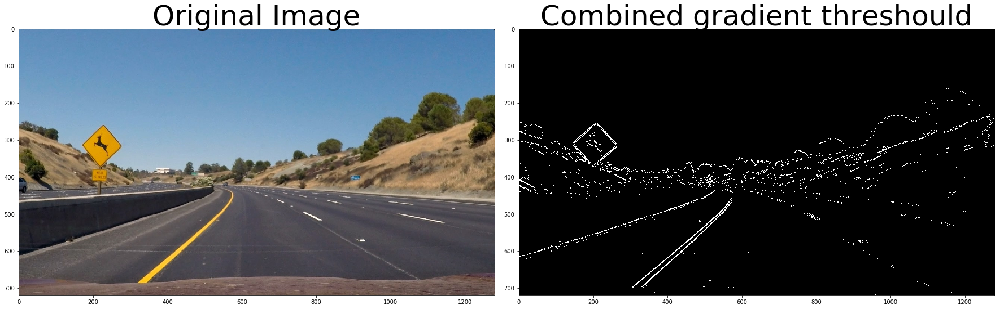

In [17]:
img = cv2.imread('test_images/test2.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

t_min = 40
t_max = 150
s_k = 3
undistorted_image_gray = cv2.cvtColor(undistorted_image,cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined_gradients, cmap='gray')
ax2.set_title('Combined gradient threshould', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Extract features through colour thresholding

Two colour thresholdings are used: Green channel and Saturation channel. I intentionally discarded using 'R' channel as it turns out that with using 'R' channel, the bright spot is recognised too much that the areas between the detected lanes are tilted too much towards the bright spot.

I am selecting test image 4 as it has a large spot for excessive brightness within the image to make a lane detection task difficult. 

In [9]:
def find_rgb(img, chan='R', thresh_min=0, thresh_max=255):
    
    if chan=='R':
        #R channel is great for detecting white lanes
        ch = img[:, :, 2]
    if chan=='G':
        ch = img[:, :, 1]
    if chan=='B':
        ch = img[:, :, 0]
        
    binary_output_rgb = np.zeros_like(ch)
    binary_output_rgb[(ch >= thresh_min) & (ch <= thresh_max)] = 1
    
    return binary_output_rgb

As seen below, the 'R' channel binary shows a large white spot towards top left.

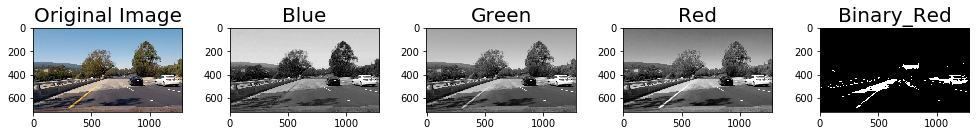

In [24]:
img = cv2.imread('test_images/test4.jpg')

#R channel is great for detecting white lanes
B = img[:, :, 0]
G = img[:, :, 1]
R = img[:, :, 2]

t_min = 200
t_max = 255

binary_output_rgb = np.zeros_like(R)
binary_output_rgb[( R >= t_min) & (R <= t_max)] = 1

f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(B, cmap='gray')
ax2.set_title('Blue', fontsize=20)
ax3.imshow(G, cmap='gray')
ax3.set_title('Green', fontsize=20)
ax4.imshow(R, cmap='gray')
ax4.set_title('Red', fontsize=20)
ax5.imshow(binary_output_rgb, cmap='gray')
ax5.set_title('Binary_Red', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

It seems to be a little weaker, but binary green with mask seems to be a better choice when there is much light.

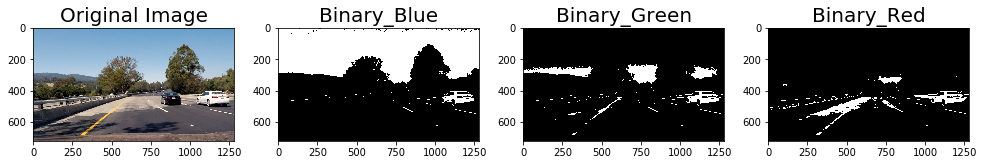

In [79]:
img = cv2.imread('test_images/test4.jpg')

t_min = 200
t_max = 255
B = find_rgb(img, 'B', 200, 255)
G = find_rgb(img, 'G', 200, 255)
R = find_rgb(img, 'R', 200, 255)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(B, cmap='gray')
ax2.set_title('Binary_Blue', fontsize=20)
ax3.imshow(G, cmap='gray')
ax3.set_title('Binary_Green', fontsize=20)
ax4.imshow(R, cmap='gray')
ax4.set_title('Binary_Red', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

The 'find_hls' function seperates 'saturation' channel and it does a great job in separation lines.

In [10]:
def find_hls(img, chan='S', thresh_min=0, thresh_max=255):
    
    hls_img = cv2.cvtColor(img,cv2.COLOR_BGR2HLS)
    
    if chan=='H':
        ch = hls_img[:, :, 0]
    if chan=='L':
        ch = hls_img[:, :, 1]
    #S channel is great for detecting both white and yellow lanes
    if chan=='S':
        ch = hls_img[:, :, 2]
        
    binary_output_hls = np.zeros_like(ch)
    binary_output_hls[(ch >= thresh_min) & (ch <= thresh_max)] = 1
    
    return binary_output_hls

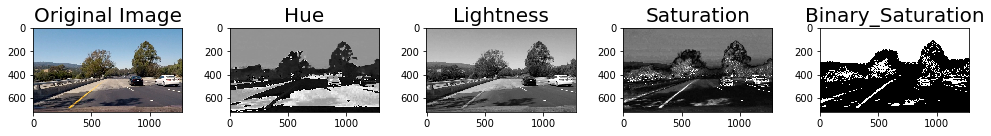

In [81]:
img = cv2.imread('test_images/test4.jpg')
hls_img = cv2.cvtColor(img,cv2.COLOR_BGR2HLS)

#S channel is great for detecting yellow lanes
H = hls_img[:, :, 0]
L = hls_img[:, :, 1]
S = hls_img[:, :, 2]

t_min = 90 #15 H
t_max = 255 #100 H

binary_output_hls = np.zeros_like(S)
binary_output_hls[( S >= t_min) & (S <= t_max)] = 1

f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(H, cmap='gray')
ax2.set_title('Hue', fontsize=20)
ax3.imshow(L, cmap='gray')
ax3.set_title('Lightness', fontsize=20)
ax4.imshow(S, cmap='gray')
ax4.set_title('Saturation', fontsize=20)
ax5.imshow(binary_output_hls, cmap='gray')
ax5.set_title('Binary_Saturation', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

'Hue' and 'Lightness' channels are noisy due to a bright area presented in the image.

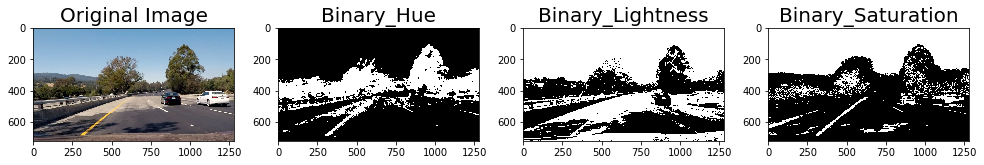

In [82]:
img = cv2.imread('test_images/test4.jpg')

t_min = 90 #15 H
t_max = 255 #100 H

H = find_hls(img, 'H', 15, 100)
L = find_hls(img, 'L', t_min, t_max)
S = find_hls(img, 'S', t_min, t_max)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(13, 13))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(H, cmap='gray')
ax2.set_title('Binary_Hue', fontsize=20)
ax3.imshow(L, cmap='gray')
ax3.set_title('Binary_Lightness', fontsize=20)
ax4.imshow(S, cmap='gray')
ax4.set_title('Binary_Saturation', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

These two colour thresholdings, channel 'G' and 'S' are combined together in the following function:

In [11]:
def combine_threshold_colour(col1, col2):
    combined_colour = np.zeros_like(col1)
    combined_colour[(col1==1) | (col2==1)] = 1
    
    return combined_colour

### Combining gradient and colour thresholding together

In this section, gradient and colour thresholdings are combined together. The image on the left below is showing contribution from grandient thresholding in green while blue colour represents colour thresholding.

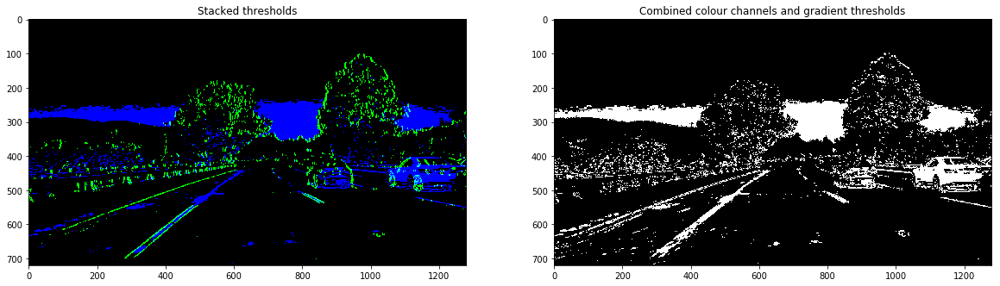

In [25]:
img = cv2.imread('test_images/test4.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)
undistorted_image_gray = cv2.cvtColor(undistorted_image,cv2.COLOR_BGR2GRAY)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'G', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), combined_gradients, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(grad_colour_binary)

ax2.set_title('Combined colour channels and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')

### Transform perspectives

I placed extra efforts to think about transforming perspectives. I thought that the original process of looking at each image mannually to transform perspectives can be improved. Thus, I experimented how to get the correct identification of four source points of the current lane that the car is located in, and decided to utilise what we have learnt previously.

My goal is to identify four coordinates for the current lane algorithmically. Therefore, I used the process of identifying lanes through a region-of-interest mask, Hough transformation and interpolation methods.

In [12]:
def confine_roi(img, edges, margin):
    #1. create a mask background from the size of an image and make all pixels black (i.e. rgb 0)
    mask_background = np.zeros_like(edges)
    
    #2. get the size of an image and define vertices of region of interests
    img_shape = img.shape
    vertices = np.array([[(margin,img_shape[0]+margin),(img_shape[1]//2, img_shape[0]//2), (img_shape[1]-margin,img_shape[0]+margin)]], dtype=np.int32)
    
    #3. areas that are not masked (i.e. region of interest) are coloured white (255)
    #where there are more than 1 channel (e.g. RGB)
    if len(img_shape) > 2:
        channel_count = img_shape[2]
        not_mask_color = (255,) * channel_count
    else:
        not_mask_color = 255
        
    
    #4. cv2.fillPoly() fills an area bounded by several polygonal outlines with 1
    cv2.fillPoly(mask_background, vertices, not_mask_color)
    
    #5. bitwise_and finds an area where both pixel values are 1
    masked_edges = cv2.bitwise_and(edges, mask_background)
    
    return masked_edges

In [13]:
def connect_edges(edges, thres, min_len, max_gap):
    #1. define parameters for hough transform: rho, theta
    #distance
    rho = 2
    #angle
    theta = np.pi/180
    #minimum number of votes
    threshold = thres
    #minimum number of pixels making up a line
    min_line_length = min_len
    #maximum gap in pixels between connectable line segments
    max_line_gap = max_gap

    #2. connect dots and edges through hough line transform
    hough_lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]), min_line_length, max_line_gap)
    
    return hough_lines

In [14]:
def interpolate_lines(img, lines):
    #initialise empty arrays for left lane and right lane Xs and Ys
    left_lanes = []
    right_lanes = []
    
    #for all lines found by hough transformation, get slopes and intercepts
    for line in lines:
        x1, y1, x2, y2 = np.squeeze(line)
        #fit each line between two points (i.e. x1, y1 and x2, y2)
        p_slope, p_int = np.polyfit((x1, x2), (y1, y2), 1)

        #if the slope is forward slash, then takes it into right; otherwise left
        if p_slope < 0:
            left_lanes.append((p_slope, p_int))
        else:
            right_lanes.append((p_slope, p_int))
        
    #get median of collections of slopes and intercepts (in case the lines are skewed) to determine a single representative lane for each
    left_lanes_median = np.median(left_lanes, axis=0)
    right_lanes_median = np.median(right_lanes, axis=0)

    return [left_lanes_median, right_lanes_median]

In [15]:
def get_xys(img_shape, lanes, margin):
    left_lanes = lanes[0]
    right_lanes = lanes[1]
    first_slope, first_int = left_lanes
    second_slope, second_int = right_lanes

    #get left lane xys through first slope and intercept
    left_y1 = img_shape[0]
    left_y2 = int(left_y1 - margin)
    left_x1 = int((left_y1 - first_int)/first_slope)
    left_x2 = int((left_y2 - first_int)/first_slope)

    #get right lane xys through second slope and intercept
    right_y1 = img_shape[0]
    right_y2 = int(right_y1 - margin)
    right_x1 = int((right_y1 - second_int)/second_slope)
    right_x2 = int((right_y2 - second_int)/second_slope)

    return [[left_x1, left_y1, left_x2, left_y2], [right_x1, right_y1, right_x2, right_y2]]

With this method of the trapezoidal detection, I don't really need to draw the lines manually. Visualisation shows that the process is working as intended.

In [16]:
def draw_lines(img, left_right_xys):
    #copy an image with zero initiations to draw lines on
    image_with_lines = np.zeros_like(img)
    img_shape = img.shape

    #going through each xys and draw a line between them for left and right lanes
    if left_right_xys is not None:
        for i in range(len(left_right_xys)):
            x1, y1, x2, y2 = left_right_xys[i]
            cv2.line(image_with_lines, (x1, y1), (x2, y2), (178, 0, 255), 5)
    return image_with_lines

[[243, 720, 549, 490], [1150, 720, 785, 490]]


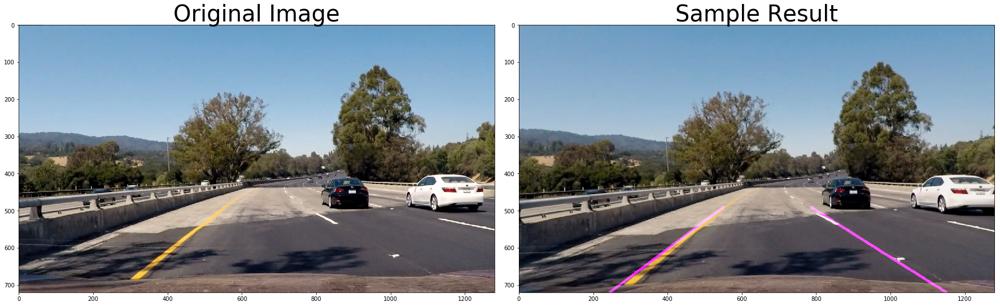

In [26]:
img = cv2.imread('test_images/test4.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)
undistorted_image_gray = cv2.cvtColor(undistorted_image,cv2.COLOR_BGR2GRAY)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 11
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'G', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

#combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

#make binary into integer & scale to 8 bit (8bit unsigned integer) to pass into hough transformation with probability
combined_binary = np.uint8(combined_binary)
combined_binary_gray = np.dstack((combined_binary, combined_binary, combined_binary))*255
masked_edges = confine_roi(undistorted_image_gray, combined_binary_gray, margin=60)
masked_edges = cv2.cvtColor(masked_edges,cv2.COLOR_BGR2GRAY)
hough_lines = connect_edges(masked_edges, thres=50, min_len=100, max_gap=50)
median_lanes = interpolate_lines(undistorted_image, hough_lines)
xys = get_xys(undistorted_image.shape, median_lanes, margin=230)
print(xys)
connected_lines = draw_lines(undistorted_image, xys)
#addWeighted src1, src1 weight, src2, src2 weight, bias
output_lines = cv2.addWeighted(undistorted_image, 0.95, connected_lines, 5., 0.)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
fig.tight_layout()

img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

output_lines = cv2.cvtColor(output_lines,cv2.COLOR_BGR2RGB)
ax2.imshow(output_lines)
ax2.set_title('Sample Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

To transform a perspective, four source points to be found and mapped against the destination points. Based on a lane finding above, four points can be drawn as follow.

In [17]:
def find_source_points(img, combined_binary):
    combined_binary = np.uint8(combined_binary)
    combined_binary_gray = np.dstack((combined_binary, combined_binary, combined_binary))*255
    masked_edges = confine_roi(img, combined_binary_gray, margin=60)
    masked_edges = cv2.cvtColor(masked_edges,cv2.COLOR_BGR2GRAY)
    hough_lines = connect_edges(masked_edges, thres=50, min_len=100, max_gap=50)
    median_lanes = interpolate_lines(img, hough_lines)
    xys = get_xys(img.shape, median_lanes, margin=230)
    xys = np.concatenate(xys)
    
    left_bot_x, left_bot_y, left_top_x, left_top_y, right_bot_x, right_bot_y, right_top_x, right_top_y = xys
    src = np.float32([[left_top_x, left_top_y], [right_top_x, right_top_y], 
                      [right_bot_x, right_bot_y], [left_bot_x, left_bot_y]])
    #uncomment to draw a trapezodial shape
#     left1 = (left_top_x, left_top_y)
#     left2 = (left_bot_x, left_bot_y)
#     right1 = (right_top_x, right_top_y)
#     right2 = (right_bot_x, right_bot_y)

#     color = [255, 0, 0]
#     w = 2
#     cv2.line(img, left1, right1, color, w)
#     cv2.line(img, left1, left2, color, w)
#     cv2.line(img, right1, right2, color, w)
#     cv2.line(img, right2, left2, color, w)
#     fig, ax = plt.subplots(figsize=(40, 20))
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
    return src

array([[  551.,   490.],
       [  770.,   490.],
       [ 1153.,   720.],
       [  233.,   720.]], dtype=float32)

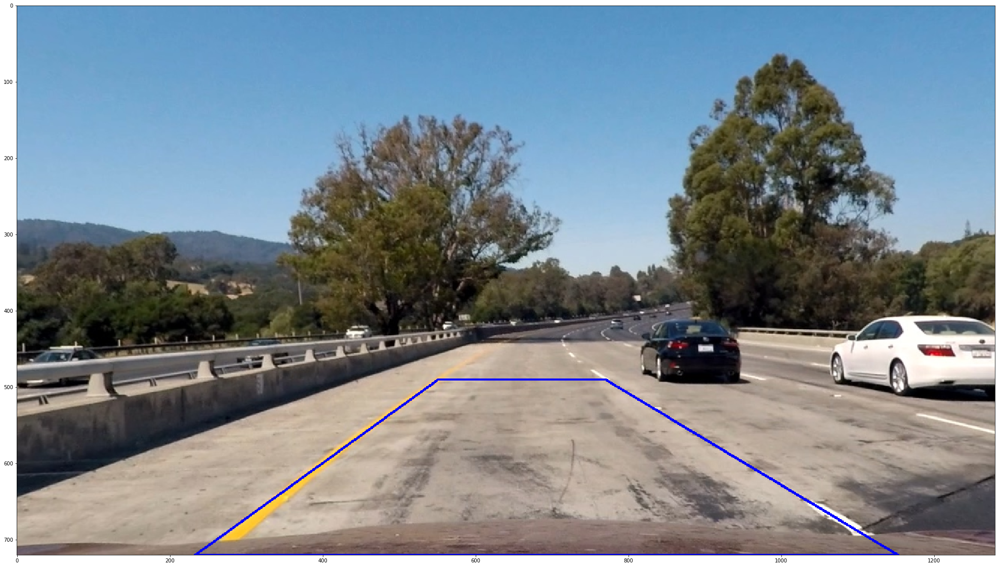

In [108]:
img = cv2.imread('test_images/test1.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 3
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'G', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

find_source_points(undistorted_image, combined_binary)

In [18]:
def find_dest_points(offset, img_size):
    #top left, top right, bottom right, bottom left
    dst = np.float32([[offset, 0],[img_size[1]-offset, 0], [img_size[1]-offset, img_size[0]], [offset, img_size[0]]])
    return dst

In [19]:
def transform_to_bird_eye_perspective(img, combined_binary):
    img_size = img.shape
    
    #define source points through hough transform and interpolation
    src = find_source_points(img, combined_binary)
    
    #define destination points
    offset = 400
    dst = find_dest_points(offset, img_size)
    
    #a perspective transform from four pairs of the corresponding points - returns perspective transform matrix
    p_matrix = cv2.getPerspectiveTransform(src, dst)
    p_matrix_inv = cv2.getPerspectiveTransform(dst, src)
    #transform perspective or warp to make an image from a bird eye view
    trsf_img = cv2.warpPerspective(img, p_matrix, (img_size[1], img_size[0]), flags=cv2.INTER_LINEAR)
    return trsf_img, p_matrix, p_matrix_inv

With the source points found, the warped image with a trapezoidal shape becomes the bird-eye view image with a rectangle as seen below.

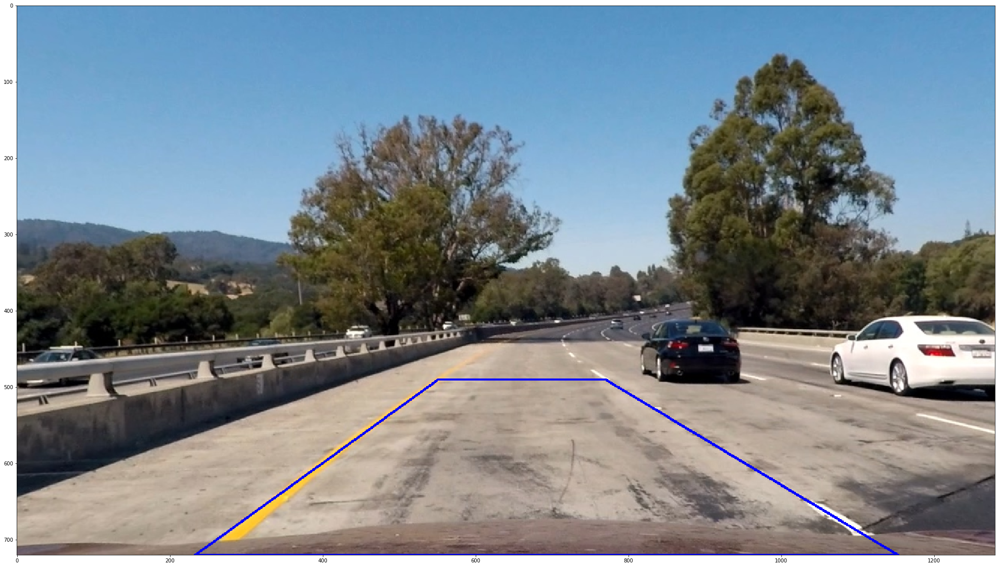

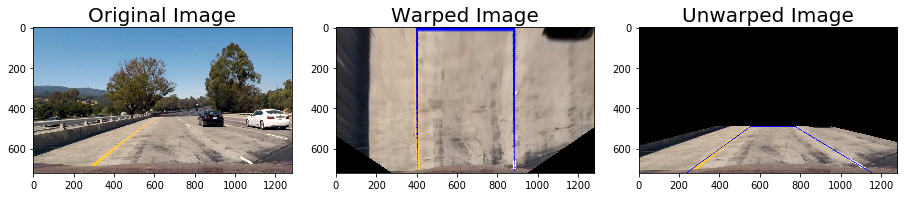

In [109]:
img = cv2.imread('test_images/test1.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 3
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'G', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)
img_size = warped_image.shape
unwarped_image = cv2.warpPerspective(warped_image, M_inv, (img_size[1], img_size[0]) , flags=cv2.INTER_LINEAR)

#change colour BGR to RGB because of cv2
output_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB)
output_unwarped_image = cv2.cvtColor(unwarped_image, cv2.COLOR_BGR2RGB)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 6))
f.tight_layout()
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(output_image)
ax2.set_title('Warped Image', fontsize=20)
ax3.imshow(output_unwarped_image, cmap='gray')
ax3.set_title('Unwarped Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Find lines from the transformed image

To find left and right lanes systematically, I will go through three steps:

* Make a histogram based on the sum of column values with standardisation and identify the two maximum points, one on the left and the other on the right side. I decided to take the whole image's histogram because in many cases, bottom half may not include any lanes due to disconnected lines.

* find lane pixels with a sliding window approach.

* find lines that represent the pixels so that the two lane lines are drawn smoothly.

In [20]:
def make_histogram(std_image):
    histogram = np.sum(std_image, axis=0)
    
    return histogram

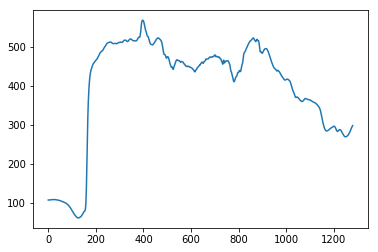

In [52]:
img = cv2.imread('test_images/test1.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 3
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'G', 200, 255)

combined_colour = combine_threshold_colour(S, R)

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)

#make it to gray and normalise bewteen 0 and 1
std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255

#colour thresholding
S_w = find_hls(warped_image, 'S', 170, 255)
# plt.imshow(S_w)
histogram = make_histogram(std_image)
plt.plot(histogram)

I utilised 10 windows to be slided for each image/frame. For each window, if there are activated pixels more than 50, they are recognised as lane line pixels.

In [23]:
def find_curved_lanes(image, histogram):
    #split histogram in the middle so that left and right lanes are distinguished
    split_mid = np.int(histogram.shape[0]//2)
    
    #to get left and right lanes estimated, only the index of the highest sum points (y position in this case) 
    #will be extracted
    left_x_est = np.argmax(histogram[:split_mid])
    right_x_est = np.argmax(histogram[split_mid:])+split_mid
    
    #number of windows to slide
    n_win = 10
    margin = 80
    min_pix_thres = 50
    
    #height of a window
    h_win = np.int(image.shape[0]//n_win)
    #indices for presence of binary 1s
    presence = image.nonzero()
    presence_y = np.array(presence[0])
    presence_x = np.array(presence[1])
    
    #initialise current x's position for left and right lane (in general, mean of the pixels)
    left_x_current = left_x_est
    right_x_current = right_x_est
    
    #when sufficient lane presence is found, the indices of their position will be stored here:
    left_x_inds = []
    right_x_inds = []
    
    out_img = np.dstack((image, image, image))
    
    for window in range(n_win):
        #define window boundary
        #top coordinates
        win_y_top = image.shape[0] - window*h_win
        win_x_left_top = left_x_current + margin
        win_x_right_top = right_x_current + margin
        #bottom coordinates
        win_y_bot = image.shape[0] - (window+1)*h_win
        win_x_left_bot = left_x_current - margin
        win_x_right_bot = right_x_current - margin
        
        #this step is not essential but for visualisation of windows
        cv2.rectangle(out_img,(win_x_left_bot,win_y_bot), (win_x_left_top,win_y_top),(0,255,0), 4) 
        cv2.rectangle(out_img,(win_x_right_bot,win_y_bot), (win_x_right_top,win_y_top),(0,255,0), 4)

        #identify pixels (indices) with 1s so that we can decide whether it is part of lanes
        good_left_inds = ((presence_y >= win_y_bot) & (presence_y < win_y_top) & 
        (presence_x >= win_x_left_bot) &  (presence_x < win_x_left_top)).nonzero()[0]
        good_right_inds = ((presence_y >= win_y_bot) & (presence_y < win_y_top) & 
        (presence_x >= win_x_right_bot) &  (presence_x < win_x_right_top)).nonzero()[0]
        
        #add this to the initialised list
        left_x_inds.append(good_left_inds)
        right_x_inds.append(good_right_inds)
        
        #check whether this indices meet the minimum threshold and 
        #if so, the mean point of these indices will be a new center for left and right lanes.
        if len(good_left_inds) > min_pix_thres:
            left_x_current = np.int(np.mean(presence_x[good_left_inds]))
        if len(good_right_inds) > min_pix_thres:
            right_x_current = np.int(np.mean(presence_x[good_right_inds]))
            
    #concatenate indices to make it to a list
    try:
        left_x_inds = np.concatenate(left_x_inds)
        right_x_inds = np.concatenate(right_x_inds)
    except ValueError:
        pass

    # Extract left and right line pixel positions
    left_x = presence_x[left_x_inds]
    left_y = presence_y[left_x_inds] 
    right_x = presence_x[right_x_inds]
    right_y = presence_y[right_x_inds]

    return [left_x, left_y, right_x, right_y, out_img]

Then, the following 'draw_lines_poly' function attempts to identify the lines that fit to the detected pixels.

In [27]:
def draw_lines_poly(points_and_img):
    #find x and y coordinates for left and right lanes
    left_x, left_y, right_x, right_y, out_img = points_and_img

    #fit a curved line for each lane through second order polinomial
    left_fit = np.polyfit(left_y, left_x, 2)
    right_fit = np.polyfit(right_y, right_x, 2)

    #for the plotting purpose, I will generate random points through the curved lines above
    #generate the number of y coordinates via np.linspace
    random_y = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])
    #because the lanes were defined through y coordinates, fit it through ay^2+by+c
    try:
        left_fit_x = left_fit[0]*random_y**2 + left_fit[1]*random_y + left_fit[2]
        right_fit_x = right_fit[0]*random_y**2 + right_fit[1]*random_y + right_fit[2]
    except TypeError:
        #if there is an error, linear lines are drawn
        print("Error occured during fitting lines.")
        left_fit_x = 1*random_y**2 + 1*random_y
        right_fit_x = 1*random_y**2 + 1*random_y

    #left lane - magenta, right lane - teal
    out_img[left_y, left_x] = [178, 0, 255]
    out_img[right_y, right_x] = [0, 128, 128]

    # Plots the left and right polynomials on the lane lines
#     plt.plot(left_fit_x, random_y, color='yellow')
#     plt.plot(right_fit_x, random_y, color='yellow')

    return left_fit, right_fit, left_fit_x, right_fit_x, out_img

As seen below, on the left side, lane pixels found confidently. However, on the right side, there is a trace of pixels on the bottom only. This is because the right side lane scarecely present in the original warped image. It is indicated that a certain form of interpolation method must be incorporated for a video stream in order to detect right side lanes reliably.

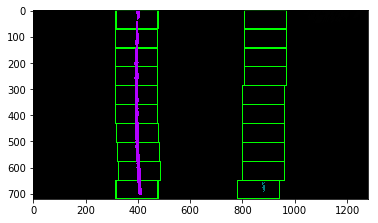

In [65]:
img = cv2.imread('test_images/test1.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 3
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'G', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)

#make it to gray and normalise bewteen 0 and 1
std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255

histogram = make_histogram(std_image)

#colour thresholding
S_w = find_hls(warped_image, 'S', 200, 255)

points_img = find_curved_lanes(S_w, histogram)
left_fit, right_fit, left_fit_x, right_fit_x, output_image = draw_lines_poly(points_img)
plt.imshow(output_image)

### Calculated the radius of curvature of the lane and the position of the vehicle with respect to center

The method to measure curvature is described below. Because the image does not represent the real size of the world, it is important to convert image x and y coordinates to the real world size. 

In [67]:
def measure_curvature(image, left_x_values, right_x_values, left_fit, right_fit):
    #estimate conversions in x and y from pixel space to meters
    y_dim = 720
    y_real = 9 #roughly there are three dashed lines in each warped image-dashed lane lines are 3 meters long each
    x_dim = 700
    x_real = 3.7
    y_per_pixel = y_real/y_dim
    x_per_pixel = x_real/x_dim
    
    #get max value of ys
    random_y = np.linspace(0, image.shape[0]-1, image.shape[0])
    y_eval = np.max(random_y)
    
    left_fit_cr = np.polyfit(random_y*y_per_pixel, left_x_values*x_per_pixel, 2)
    right_fit_cr = np.polyfit(random_y*y_per_pixel, right_x_values*x_per_pixel, 2)
    
    left_curve = ((1+(2*left_fit_cr[0]*y_eval*y_per_pixel+left_fit_cr[1])**2)**(3/2))/np.absolute(2*left_fit_cr[0])
    right_curve = ((1+(2*right_fit_cr[0]*y_eval*y_per_pixel+right_fit_cr[1])**2)**(3/2))/np.absolute(2*right_fit_cr[0])
    
    #calculate middle curvature from left and right curve
    mean_curve = (left_curve+right_curve)/2
    
    #calcuate distance 
    left_lane = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    
    #car position in the image
    car_image_position = image.shape[1]/2
    
    #car position calcuated between lanes
    car_lane_position= (left_lane + right_lane)/2
    
    #how far from the centre
    distance_centre= (car_image_position - car_lane_position)* x_per_pixel
    
    return mean_curve, distance_centre

The mean of the curvature for the test 3 image is found to be 4075m.

In [68]:
img = cv2.imread('test_images/test3.jpg')
img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
undistorted_image = undistort_img(img, obj_p, img_p)

#gradient thresholding
t_min = 40
t_max = 150
s_k = 3
undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

#colour thresholding
S = find_hls(img, 'S', 170, 255)
R = find_rgb(img, 'G', 200, 255)

combined_colour = combine_threshold_colour(S, R)

#green-gradients, blue-colour
grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

# Combine the two binary thresholds
combined_binary = np.zeros_like(combined_gradients)
combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1
warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)

#make it to gray and normalise bewteen 0 and 1
std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255

histogram = make_histogram(std_image)

#colour thresholding
S_w = find_hls(warped_image, 'S', 200, 255)

points_img = find_curved_lanes(S_w, histogram)
left_fit, right_fit, left_fit_x, right_fit_x, output_image = draw_lines_poly(points_img)
mean_curve, distance_centre = measure_curvature(output_image, left_fit_x, right_fit_x, left_fit, right_fit)

direction = 'right'
if distance_centre<0:
    direction = 'left'
print("radius of curvature: %.3f m" % mean_curve)
print("distance from centre: %.3f m %s from the centre" % (np.absolute(distance_centre), direction))

radius of curvature: 366.771 m
distance from centre: 0.010 m left from the centre


## Build the pipeline with helper functions and still image testing

In this section, all the helper functions outlined above are integrated together to draw the areas between lanes and save this result into the output folder.

In [36]:
def draw_lane_areas(org_img, warped_image, inv_matrix, left_fit_x, right_fit_x):
    #np.linspace returns evenly spaced numbers over a specified interval - start, stop, number of points
    random_y = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0])
    #np.vstack stacks arrays in sequence in a row-wise - e.g. left_fit_x and random_y are stacked sequentially
    left_lane = np.array(np.vstack([left_fit_x, random_y]).T)
    right_lane = np.array(np.flipud((np.vstack([right_fit_x, random_y]).T)))
    both_lanes = np.vstack((left_lane, right_lane))
    #fill the warped image with colour of lane width
    cv2.fillPoly(warped_image, np.int_([both_lanes]), [117, 29, 168])
    #unwarped image with previous inverse transformation matrix
    img_size = warped_image.shape
    unwarped_image = cv2.warpPerspective(warped_image, inv_matrix, (img_size[1], img_size[0]) , flags=cv2.INTER_LINEAR)
    #add two images together
    output_image = cv2.addWeighted(org_img, 1, unwarped_image, 0.2, 0)

    return output_image

In [65]:
def write_text(output_img, mean_curve, distance_centre):
    font = 0 #FONT_HERSHEY_SIMPLEX
    direction = 'right'
    if distance_centre<0:
        direction = 'left'
    cv2.putText(output_img,"radius of curvature: {:.3f}".format(mean_curve)+"m", (700,90), font, 1, (255,255,255), 3)
    cv2.putText(output_img,str(direction)+" distance from centre: {:.3f}".format(np.absolute(distance_centre))+"m", (700,140), font, 1, (255,255,255), 3)

In [38]:
def save_result(output_image, img):
    #create a directory for saving outputs if the directory does not exist
    if not os.path.isdir('output_images'):
        os.mkdir('output_images')
    #define the directory path to save outputs
    path_to_save = os.path.join('output_images/', img)
    #write a resulting image
    cv2.imwrite(path_to_save, output_image)

The 'finding_curved_lanes_pipeline' function encompasses the step-by-step application of a lane detection approch below. This pipeline is applied to each image in the test folder.

In [59]:
def finding_curved_lanes_pipeline(path_to_img):
    #create image points and object points with chessboard to identify distortion distance
    img_p, obj_p = create_object_image_points(n_x=9, n_y=6)
    for image in os.listdir(path_to_img):
        #read in image
        img = cv2.imread(os.path.join(path_to_img, image))
        #undistort the image
        undistorted_image = undistort_img(img, obj_p, img_p)

        #gradient thresholding
        t_min = 40
        t_max = 150
        s_k = 3
        undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
        x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
        y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
        mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
        dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

        combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

        #colour thresholding
        S = find_hls(img, 'S', 170, 255)
        R = find_rgb(img, 'R', 200, 255)

        combined_colour = combine_threshold_colour(S, R)

        #green-gradients, blue-colour
        grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

        #combine the two binary thresholds
        combined_binary = np.zeros_like(combined_gradients)
        combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1
        
        #make an image to a bird eye view
        warped_image, M, M_inv = transform_to_bird_eye_perspective(undistorted_image, combined_binary)

        #colour thresholding
        S_w = find_hls(warped_image, 'S', 200, 255)
        
        #make it to gray and normalise bewteen 0 and 1
        std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255
        histogram = make_histogram(std_image)

        points_img = find_curved_lanes(S_w, histogram)
        left_fit, right_fit, left_fit_x, right_fit_x, output_image = draw_lines_poly(points_img)
        
        #measure left and right curvature
        mean_curve, distance_centre = measure_curvature(output_image, left_fit_x, right_fit_x, left_fit, right_fit)

        #draw the colored areas between identified lanes and put text
        output_image = draw_lane_areas(img, warped_image, M_inv, left_fit_x, right_fit_x)
        write_text(output_image, mean_curve, distance_centre)
        
        #save output images
        save_result(output_image, image)
        
        #visualise the resulting images
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        fig.tight_layout()
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=40)
        
        output_image = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)
        ax2.imshow(output_image)
        ax2.set_title('Sample Result', fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

The lane areas are reliably drawn for each of original image. However, I expect the streams from the project video to be more challenging because there are many frames that require attention to shadow, brightness and greater curved areas.

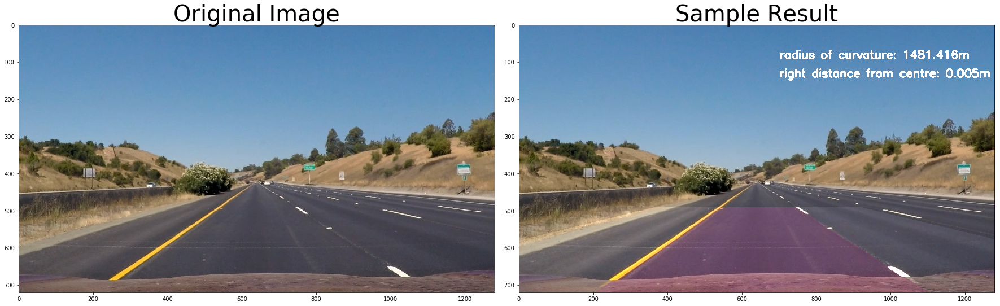

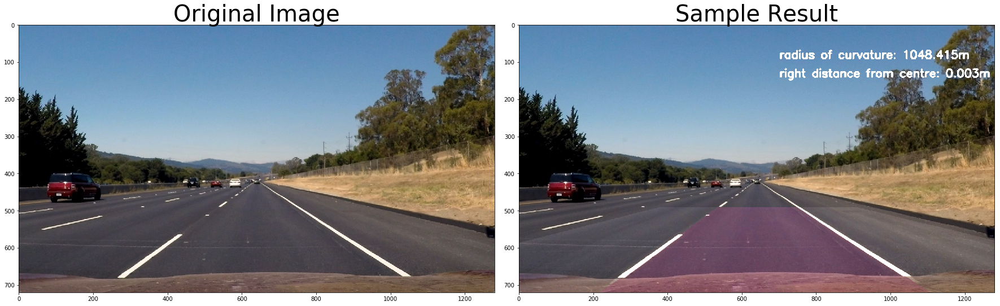

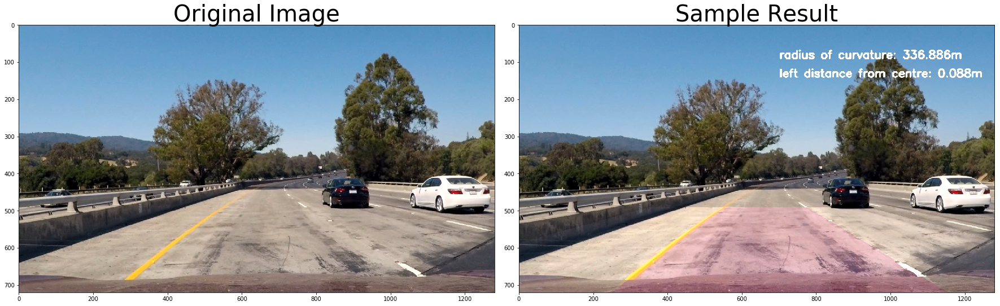

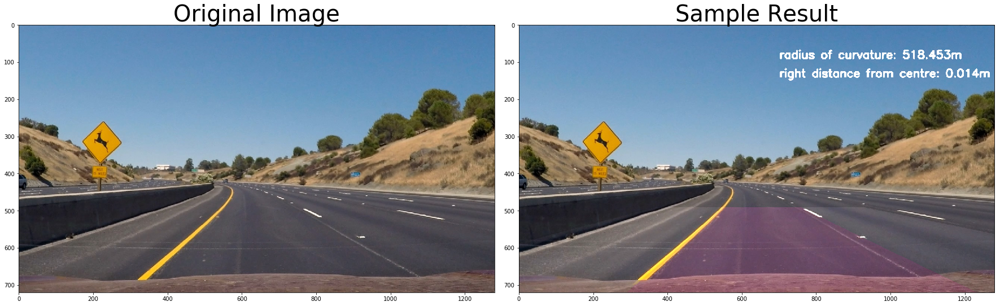

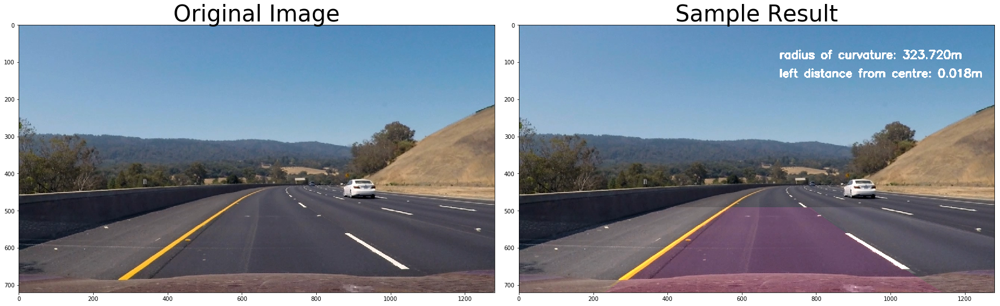

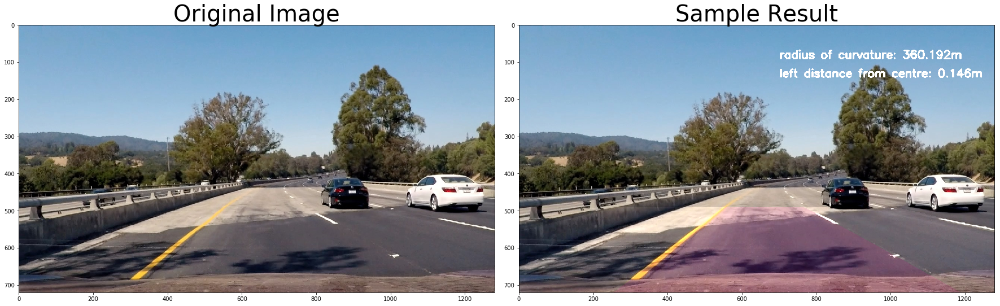

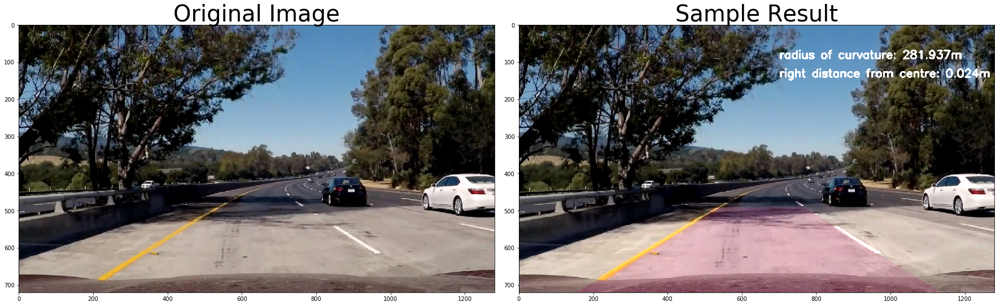

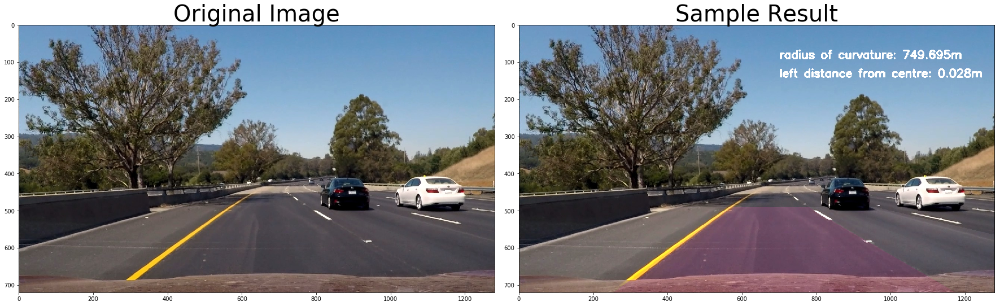

In [66]:
finding_curved_lanes_pipeline('test_images/')

## Video stream testing

### Limit the search on a next frame and average lanes

For video streams, 

1) Once the lanes from the first image capture are located, the information from this process can be used to identify the next frames of the same video. 

2) The trapezoidal shape identification is also averaged so that curved areas or lanes with bright spots are not sensitive towards outliers. 

3) A new detection of the lanes are added to the mean of the previous lane lines with the weight to avoid jitter in a stream.

In [81]:
import collections
class LaneFindingVideo:
    def __init__(self):
        #create image points and object points only once with chessboard to identify distortion distance
        self.img_p, self.obj_p = create_object_image_points(n_x=9, n_y=6)
        self.left_fit = collections.deque(maxlen=10)
        self.right_fit = collections.deque(maxlen=10)
        self.first_slope = collections.deque(maxlen=20)
        self.first_int = collections.deque(maxlen=20)
        self.second_slope = collections.deque(maxlen=20)
        self.second_int = collections.deque(maxlen=20)
        self.capture = 0
    
    def get_xys(self, img_shape, lanes, margin):
        left_lanes = lanes[0]
        right_lanes = lanes[1]
        #give weight to the current trapezoidal shape and the rest of weights to the previous mean values
        w_lane = 0.1
        #if both lanes are nan
        if np.isnan(left_lanes).any() and np.isnan(right_lanes).any():
            first_slope, first_int = np.mean(self.first_slope, axis=0), np.mean(self.first_int, axis=0)
            second_slope, second_int = np.mean(self.second_slope, axis=0), np.mean(self.second_int, axis=0)
        #if left_lanes is nan
        elif np.isnan(left_lanes).any():
            first_slope, first_int = np.mean(self.first_slope, axis=0), np.mean(self.first_int, axis=0)
            second_slope, second_int = right_lanes
            second_slope, second_int = w_lane*second_slope + (1-w_lane)*np.mean(self.second_slope, axis=0), \
            w_lane*second_int + (1-w_lane)*np.mean(self.second_int, axis=0)
        #if right_lanes is nan
        elif np.isnan(right_lanes).any():
            first_slope, first_int = left_lanes
            first_slope, first_int = w_lane*first_slope + (1-w_lane)*np.mean(self.first_slope, axis=0), \
            w_lane*first_int + (1-w_lane)*np.mean(self.first_int, axis=0)
            second_slope, second_int = np.mean(self.second_slope, axis=0), np.mean(self.second_int, axis=0)
        else:
            first_slope, first_int = left_lanes
            second_slope, second_int = right_lanes
            if len(self.first_slope)!=0 and len(self.first_int)!=0 and \
            len(self.second_slope)!=0 and len(self.second_int)!=0:
                first_slope, first_int = w_lane*first_slope + (1-w_lane)*np.mean(self.first_slope, axis=0), \
                w_lane*first_int + (1-w_lane)*np.mean(self.first_int, axis=0)
                second_slope, second_int = w_lane*second_slope + (1-w_lane)*np.mean(self.second_slope, axis=0), \
                w_lane*second_int + (1-w_lane)*np.mean(self.second_int, axis=0)
            self.first_slope.append(first_slope)
            self.first_int.append(first_int)
            self.second_slope.append(second_slope)
            self.second_int.append(second_int)
            
        #3. get left lane xys through first slope and intercept
        left_y1 = img_shape[0]
        left_y2 = int(left_y1 - margin)
        left_x1 = int((left_y1 - first_int)/first_slope)
        left_x2 = int((left_y2 - first_int)/first_slope)

        #4. get right lane xys through second slope and intercept
        right_y1 = img_shape[0]
        right_y2 = int(right_y1 - margin)
        right_x1 = int((right_y1 - second_int)/second_slope)
        right_x2 = int((right_y2 - second_int)/second_slope)

        return [[left_x1, left_y1, left_x2, left_y2], [right_x1, right_y1, right_x2, right_y2]]
    
    def find_source_points(self, img, combined_binary):

        combined_binary = np.uint8(combined_binary)
        combined_binary_gray = np.dstack((combined_binary, combined_binary, combined_binary))*255
        masked_edges = confine_roi(img, combined_binary_gray, margin=60)
        masked_edges = cv2.cvtColor(masked_edges,cv2.COLOR_BGR2GRAY)
        hough_lines = connect_edges(masked_edges, thres=50, min_len=100, max_gap=50)
        median_lanes = interpolate_lines(img, hough_lines)
        xys = self.get_xys(img.shape, median_lanes, margin=230)
        xys = np.concatenate(xys)

        left_bot_x, left_bot_y, left_top_x, left_top_y, right_bot_x, right_bot_y, right_top_x, right_top_y = xys

        src = np.float32([[left_top_x, left_top_y], [right_top_x, right_top_y], 
                          [right_bot_x, right_bot_y], [left_bot_x, left_bot_y]])
        return src
    
    def transform_to_bird_eye_perspective(self, img, combined_binary):
        img_size = img.shape

        #define source points through hough transform and interpolation
        src = self.find_source_points(img, combined_binary)

        #define destination points
        offset = 400
        dst = find_dest_points(offset, img_size)

        #a perspective transform from four pairs of the corresponding points - returns perspective transform matrix
        p_matrix = cv2.getPerspectiveTransform(src, dst)
        p_matrix_inv = cv2.getPerspectiveTransform(dst, src)
        #transform perspective or warp to make an image from a bird eye view
        trsf_img = cv2.warpPerspective(img, p_matrix, (img_size[1], img_size[0]), flags=cv2.INTER_LINEAR)
        
        return trsf_img, p_matrix, p_matrix_inv
    
    
    def find_curved_lanes(self, image, histogram):
        #split histogram in the middle so that left and right lanes are distinguished
        split_mid = np.int(histogram.shape[0]//2)

        #to get left and right lanes estimated, only the index of the highest sum points (y position in this case) 
        #will be extracted
        left_x_est = np.argmax(histogram[:split_mid])
        right_x_est = np.argmax(histogram[split_mid:])+split_mid

        #number of windows to slide
        n_win = 10
        margin = 100
        min_pix_thres = 50

        #height of a window
        h_win = np.int(image.shape[0]//n_win)
        #indices for presence of binary 1s
        presence = image.nonzero()
        presence_y = np.array(presence[0])
        presence_x = np.array(presence[1])

        #initialise current x's position for left and right lane (in general, mean of the pixels)
        left_x_current = left_x_est
        right_x_current = right_x_est

        #when sufficient lane presence is found, the indices of their position will be stored here:
        left_x_inds = []
        right_x_inds = []
        
        if len(self.left_fit)==0 or len(self.right_fit)==0:
            for window in range(n_win):
                #define window boundary
                #top coordinates
                win_y_top = image.shape[0] - window*h_win
                win_x_left_top = left_x_current + margin
                win_x_right_top = right_x_current + margin
                #bottom coordinates
                win_y_bot = image.shape[0] - (window+1)*h_win
                win_x_left_bot = left_x_current - margin
                win_x_right_bot = right_x_current - margin

                #identify pixels (indices) with 1s so that we can decide whether it is part of lanes
                good_left_inds = ((presence_y >= win_y_bot) & (presence_y < win_y_top) & 
                (presence_x >= win_x_left_bot) &  (presence_x < win_x_left_top)).nonzero()[0]
                good_right_inds = ((presence_y >= win_y_bot) & (presence_y < win_y_top) & 
                (presence_x >= win_x_right_bot) &  (presence_x < win_x_right_top)).nonzero()[0]

                #add this to the initialised list
                left_x_inds.append(good_left_inds)
                right_x_inds.append(good_right_inds)

                #check whether this indices meet the minimum threshold and 
                #if so, the mean point of these indices will be a new center for left and right lanes.
                if len(good_left_inds) > min_pix_thres:
                    left_x_current = np.int(np.mean(presence_x[good_left_inds]))
                if len(good_right_inds) > min_pix_thres:
                    right_x_current = np.int(np.mean(presence_x[good_right_inds]))

            #concatenate indices to make it to a list
            left_x_inds = np.concatenate(left_x_inds)
            right_x_inds = np.concatenate(right_x_inds)
        else:
            #margin of the search area
            margin = 100

            #indices for presence of binary 1s
            presence = image.nonzero()
            presence_y = np.array(presence[0])
            presence_x = np.array(presence[1])
            
            #left fit and right fit from previous windows
            left_fit = self.left_fit[len(self.left_fit)-1]
            right_fit = self.right_fit[len(self.right_fit)-1]
            
            #define search area to be limited within polinomial lines +- margin
            left_x_inds = (presence_x >= (left_fit[0]*presence_y**2+left_fit[1]*presence_y+left_fit[2]-margin)) \
            & (presence_x <= (left_fit[0]*presence_y**2+left_fit[1]*presence_y+left_fit[2]+margin))  
            right_x_inds = (presence_x >= (right_fit[0]*presence_y**2+right_fit[1]*presence_y+right_fit[2]-margin)) \
            & (presence_x <= (right_fit[0]*presence_y**2+right_fit[1]*presence_y+right_fit[2]+margin))

        # Extract left and right line pixel positions
        left_x = presence_x[left_x_inds]
        left_y = presence_y[left_x_inds] 
        right_x = presence_x[right_x_inds]
        right_y = presence_y[right_x_inds]

        return [left_x, left_y, right_x, right_y]
    
    def draw_lines_poly(self, points_and_img, out_img):
        #find x and y coordinates for left and right lanes
        left_x, left_y, right_x, right_y = points_and_img

        #fit a curved line for each lane through second order polinomial - weighted average
        #weight for the current lane lines
        w_poly = 0.012
        if len(left_x)==0 and len(right_x)==0:
            left_fit = np.mean(self.left_fit, axis=0)
            right_fit = np.mean(self.right_fit, axis=0)
        elif len(left_x)==0:
            left_fit = np.mean(self.left_fit, axis=0)
            right_fit = w_poly*np.polyfit(right_y, right_x, 2) + (1-w_poly)*np.mean(self.right_fit, axis=0)
        elif len(right_x)==0:
            left_fit = w_poly*np.polyfit(left_y, left_x, 2) + (1-w_poly)*np.mean(self.left_fit, axis=0)
            right_fit = np.mean(self.right_fit, axis=0)
        else:
            left_fit = np.polyfit(left_y, left_x, 2)
            right_fit = np.polyfit(right_y, right_x, 2)
            if len(self.left_fit)!=0 and len(self.right_fit)!=0:
                left_fit = w_poly*left_fit + (1-w_poly)*np.mean(self.left_fit, axis=0)
                right_fit = w_poly*right_fit + (1-w_poly)*np.mean(self.right_fit, axis=0)
            self.left_fit.append(left_fit)
            self.right_fit.append(right_fit)

        #for the plotting purpose, I will generate random points through the curved lines above
        #generate the number of y coordinates via np.linspace
        random_y = np.linspace(0, out_img.shape[0]-1, out_img.shape[0])
        #because the lanes were defined through y coordinates, fit it through ay^2+by+c
        try:
            left_fit_x = left_fit[0]*random_y**2 + left_fit[1]*random_y + left_fit[2]
            right_fit_x = right_fit[0]*random_y**2 + right_fit[1]*random_y + right_fit[2]
        except TypeError:
            #if there is an error, linear lines are drawn
            print("Error occured during fitting lines.")
            left_fit_x = 1*random_y**2 + 1*random_y
            right_fit_x = 1*random_y**2 + 1*random_y

        return left_fit, right_fit, left_fit_x, right_fit_x
    
    def draw_lane_areas(self, org_img, warped_image, inv_matrix, left_fit_x, right_fit_x):
        #np.linspace returns evenly spaced numbers over a specified interval - start, stop, number of points
        random_y = np.linspace(0, warped_image.shape[0]-1, warped_image.shape[0])
        #np.vstack stacks arrays in sequence in a row-wise - e.g. left_fit_x and random_y are stacked sequentially
        left_lane = np.array(np.vstack([left_fit_x, random_y]).T)
        right_lane = np.array(np.flipud((np.vstack([right_fit_x, random_y]).T)))
        both_lanes = np.vstack((left_lane, right_lane))
        #fill the warped image with green colour of lane width
        cv2.fillPoly(warped_image, np.int_([both_lanes]), [0, 255, 0])
        #unwarped image with previous inverse transformation matrix
        img_size = warped_image.shape
        unwarped_image = cv2.warpPerspective(warped_image, inv_matrix, (img_size[1], img_size[0]) , flags=cv2.INTER_LINEAR)
        #add two images together
        output_image = cv2.addWeighted(org_img, 1, unwarped_image, 0.2, 0)

        return output_image

    def process_image(self, img):
        #undistort the image
        undistorted_image = undistort_img(img, obj_p, img_p)

        #gradient thresholding
        t_min = 40
        t_max = 150
        s_k = 11
        undistorted_image_gray = cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2GRAY)
        x_grad = find_sobel(undistorted_image_gray, 'x', s_k, t_min, t_max)
        y_grad = find_sobel(undistorted_image_gray, 'y', s_k, t_min, t_max)
        mag_image = find_magnitude(undistorted_image_gray, s_k, t_min, t_max)
        dir_image = find_direction(undistorted_image_gray, s_k, thresh_min=0.7, thresh_max=1.3)

        combined_gradients = combine_threshold_gradients(x_grad, y_grad, mag_image, dir_image)

        #colour thresholding
        S = find_hls(img, 'S', 170, 255)
        R = find_rgb(img, 'R', 200, 255)

        combined_colour = combine_threshold_colour(S, R)

        #green-gradients, blue-colour
        grad_colour_binary = np.dstack((np.zeros_like(x_grad), x_grad, combined_colour))*255

        #combine the two binary thresholds
        combined_binary = np.zeros_like(combined_gradients)
        combined_binary[(combined_gradients==1) | (combined_colour==1)] = 1

        #make an image to a bird eye view
        warped_image, M, M_inv = self.transform_to_bird_eye_perspective(undistorted_image, combined_binary)

        #make it to gray and normalise bewteen 0 and 1
        std_image = cv2.cvtColor(warped_image, cv2.COLOR_BGR2GRAY)/255
        #calculate bottom half of the image into histogram to roughly identify left and right lane position
        histogram = make_histogram(std_image)
        
        #colour thresholding
        S_w = find_hls(warped_image, 'S', 200, 255)
        #find x and y positions of left and right lanes
        points_img = self.find_curved_lanes(S_w, histogram)
        #fit a polynomial line for left and right lane so that we can predict x positions
        left_fit, right_fit, left_fit_x, right_fit_x = self.draw_lines_poly(points_img, warped_image)
        
        #draw the colored areas between identified lanes and write text on the output image
        output_image = self.draw_lane_areas(img, warped_image, M_inv, left_fit_x, right_fit_x)
        mean_curve, distance_centre = measure_curvature(output_image, left_fit_x, right_fit_x, left_fit, right_fit)
        write_text(output_image, mean_curve, distance_centre)
        
        return output_image

In [82]:
def find_lanes_on_test_videos(path_to_videos):
        #define a video stream to process and make it into many clips/images
        clip1 = VideoFileClip(path_to_videos)#.subclip(23, 25)

        lane_class = LaneFindingVideo()

        #replace each clip of a video stream with the processed result through the pipeline
        processed_clip = clip1.fl_image(lane_class.process_image)

        #write each frame of output image into a video stream
        video_path_to_save = "test_videos_output/project_video.mp4"
        %time processed_clip.write_videofile(video_path_to_save, audio=False)

In [83]:
find_lanes_on_test_videos('project_video.mp4')

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [26:03<00:01,  1.24s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 26min 12s, sys: 4.47 s, total: 26min 17s
Wall time: 26min 5s


In [85]:
clip2 = (VideoFileClip("test_videos_output/project_video_15_20_0.0125_0.1.mp4").resize(0.2))
clip2.write_gif("test_videos_output/project_video.gif")


[MoviePy] Building file test_videos_output/project_video.gif with imageio


100%|█████████▉| 1260/1261 [01:00<00:00, 20.95it/s]


![project_video_gif](test_videos_output/project_video.gif)